In [1]:
!wget --no-check-certificate \
  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
  -O cats_and_dogs_filtered.zip

--2020-08-24 08:52:20--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 216.58.195.80, 172.217.6.80, 172.217.0.48, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|216.58.195.80|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘cats_and_dogs_filtered.zip’

cats_and_dogs_filte 100%[===================>]  65.43M  32.5MB/s    in 2.0s    

2020-08-24 08:52:22 (32.5 MB/s) - ‘cats_and_dogs_filtered.zip’ saved [68606236/68606236]



In [2]:
!unzip -o -qq cats_and_dogs_filtered.zip

In [3]:
from tensorflow import keras
import os, sys
from matplotlib import pyplot

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Conv2D, MaxPool2D , Flatten, MaxPooling2D
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

In [5]:
# plot diagnostic learning curves
def summarize_diagnostics(history):
    # plot loss
    pyplot.subplot(211)
    pyplot.title('Cross Entropy Loss')
    pyplot.plot(history.history['loss'], color='blue', label='train')
    pyplot.plot(history.history['val_loss'], color='orange', label='test')
    # plot accuracy
    pyplot.subplot(212)
    pyplot.title('Classification Accuracy')
    pyplot.plot(history.history['accuracy'], color='blue', label='train')
    pyplot.plot(history.history['val_accuracy'], color='orange', label='test')
    # save plot to file
    filename = sys.argv[0].split('/')[-1]
    pyplot.savefig(filename + '_plot.png')
    pyplot.close()


In [6]:
# run the test harness for evaluating a model
def run_test_harness(model):
    # create data generators
    train_datagen = ImageDataGenerator(rescale=1.0/255.0,
        width_shift_range=0.1, height_shift_range=0.1, horizontal_flip=True)
    test_datagen = ImageDataGenerator(rescale=1.0/255.0)
    # prepare iterators
    train_it = train_datagen.flow_from_directory('cats_and_dogs_filtered/train/',
        class_mode='binary', batch_size=64, target_size=(200, 200))
    test_it = test_datagen.flow_from_directory('cats_and_dogs_filtered/validation/',
        class_mode='binary', batch_size=64, target_size=(200, 200))
    # fit model
    history = model.fit_generator(train_it, steps_per_epoch=len(train_it),
        validation_data=test_it, validation_steps=len(test_it), epochs=1, )
    # evaluate model
    _, acc = model.evaluate_generator(test_it, steps=len(test_it))
    print('> %.3f' % (acc * 100.0))
    # learning curves
    summarize_diagnostics(history)


In [7]:
os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [8]:
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications.vgg16 import VGG16

# define cnn model
def define_model_vgg():
	# load model
	model = VGG16(include_top=False, input_shape=(224, 224, 3))
	# mark loaded layers as not trainable
	for layer in model.layers:
		layer.trainable = False
	# add new classifier layers
	flat1 = Flatten()(model.layers[-1].output)
	class1 = Dense(128, activation='relu', kernel_initializer='he_uniform')(flat1)
	output = Dense(1, activation='sigmoid')(class1)
	# define new model
	model = Model(inputs=model.inputs, outputs=output)
	# compile model
	opt = SGD(lr=0.001, momentum=0.9)
	model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
	return model

In [9]:
model_vgg = define_model_vgg()
model_vgg.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)      

In [10]:
# create data generator
datagen = ImageDataGenerator(featurewise_center=True)
# specify imagenet mean values for centering
datagen.mean = [123.68, 116.779, 103.939]
# prepare iterator
train_it = datagen.flow_from_directory('cats_and_dogs_filtered/train/',
    class_mode='binary', batch_size=64, target_size=(224, 224))
test_it = datagen.flow_from_directory('cats_and_dogs_filtered/validation/',
    class_mode='binary', batch_size=64, target_size=(224, 224))
# fit model
history = model_vgg.fit_generator(train_it, steps_per_epoch=len(train_it),
    validation_data=test_it, validation_steps=len(test_it), epochs=10, verbose=1)
# evaluate model
_, acc = model_vgg.evaluate_generator(test_it, steps=len(test_it), verbose=0)
print('> %.3f' % (acc * 100.0))
# learning curves
summarize_diagnostics(history)


Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/10
32/32 [==============================] - 196s 6s/step - loss: 1.0361 - accuracy: 0.9445 - val_loss: 0.4515 - val_accuracy: 0.9730
Epoch 2/10
32/32 [==============================] - 195s 6s/step - loss: 0.1556 - accuracy: 0.9810 - val_loss: 0.2745 - val_accuracy: 0.9690
Epoch 3/10
32/32 [==============================] - 195s 6s/step - loss: 0.0479 - accuracy: 0.9930 - val_loss: 0.1684 - val_accuracy: 0.9770
Epoch 4/10
32/32 [==============================] - 195s 6s/step - loss: 0.0247 - accuracy: 0.9950 - val_loss: 0.2062 - val_accuracy: 0.9750
Epoch 5/10
32/32 [==============================] - 195s 6s/step - loss: 0.0041 - accuracy: 0.9995 - val_loss: 0.1594 - val_accuracy: 0.9770
Epoch 6/10
32/32 [==============================] - 195s 6s/step - loss: 0.0012 - accuracy: 0.9995 - val_loss: 0.1740 - val_accuracy: 0

In [11]:
_, acc = model_vgg.evaluate_generator(test_it, steps=len(test_it), verbose=0)
print('> %.3f' % (acc * 100.0))


> 97.400


In [12]:
layer_outputs = [layer.output for layer in model_vgg.layers]

activation_model = Model(inputs=model_vgg.input, outputs=layer_outputs)


In [13]:
layer_names = []
for layer in model_vgg.layers:
    layer_names.append(layer.name)
    
layer_names


['input_1',
 'block1_conv1',
 'block1_conv2',
 'block1_pool',
 'block2_conv1',
 'block2_conv2',
 'block2_pool',
 'block3_conv1',
 'block3_conv2',
 'block3_conv3',
 'block3_pool',
 'block4_conv1',
 'block4_conv2',
 'block4_conv3',
 'block4_pool',
 'block5_conv1',
 'block5_conv2',
 'block5_conv3',
 'block5_pool',
 'flatten',
 'dense',
 'dense_1']

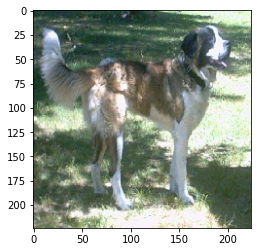

In [14]:
from tensorflow.keras.preprocessing import image

img = image.load_img('cats_and_dogs_filtered/validation/dogs/dog.2468.jpg', target_size=(224, 224))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
pyplot.imshow(img, cmap="binary")


In [15]:
activations = activation_model.predict(img_tensor)
len(activations)


22

/usr/lib/python3/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


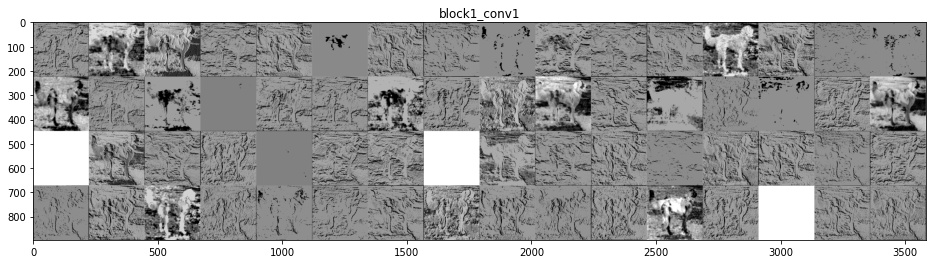

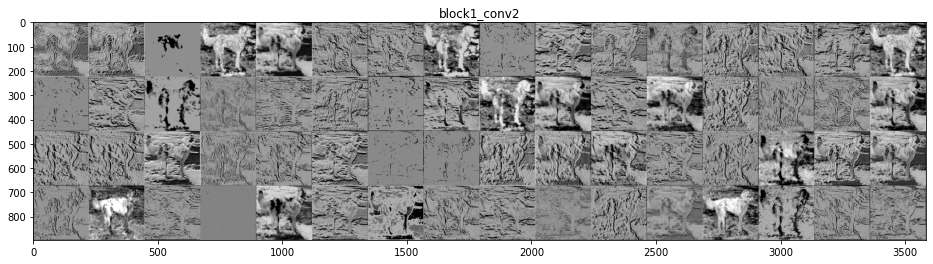

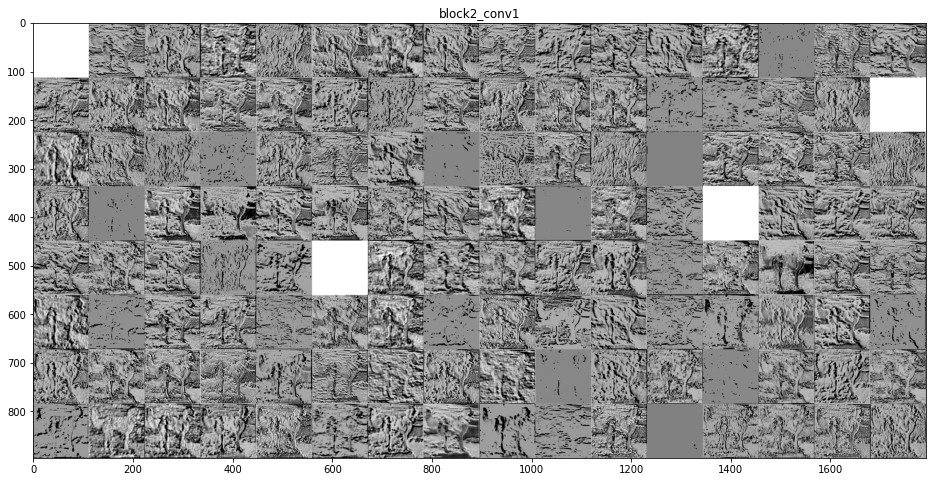

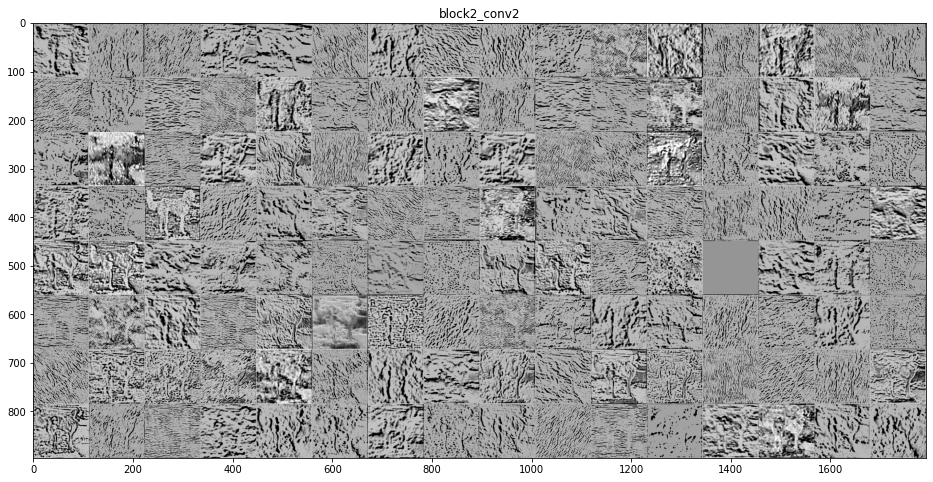

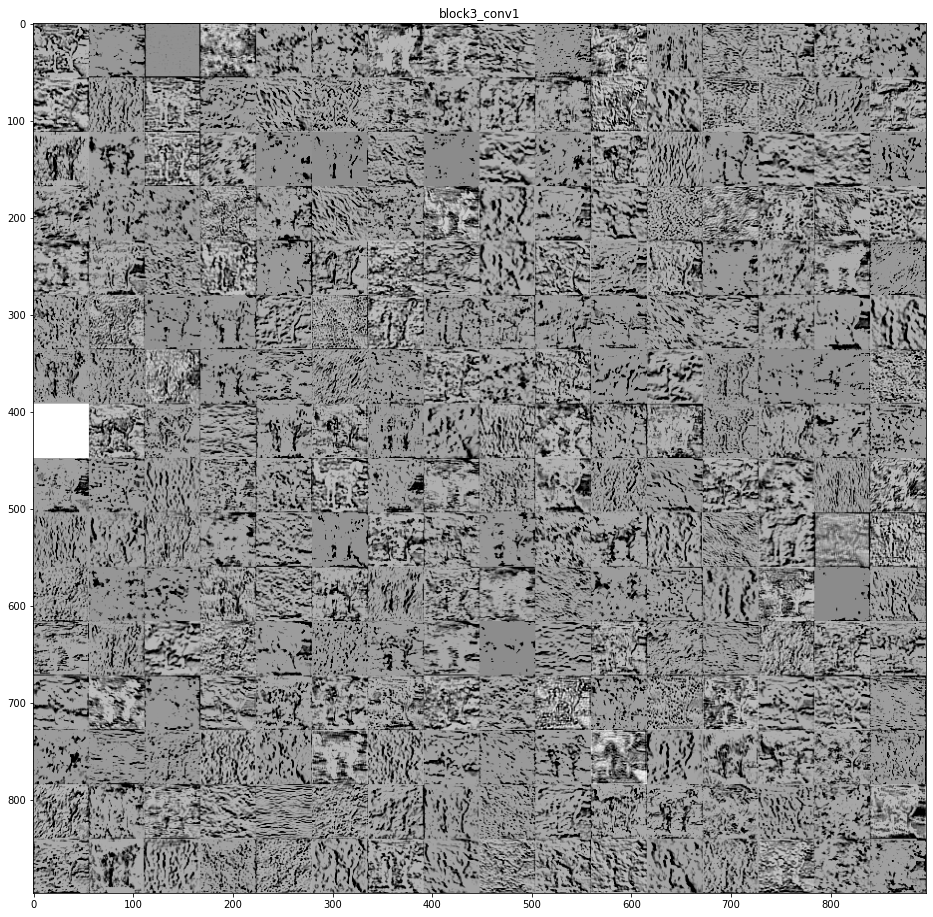

...

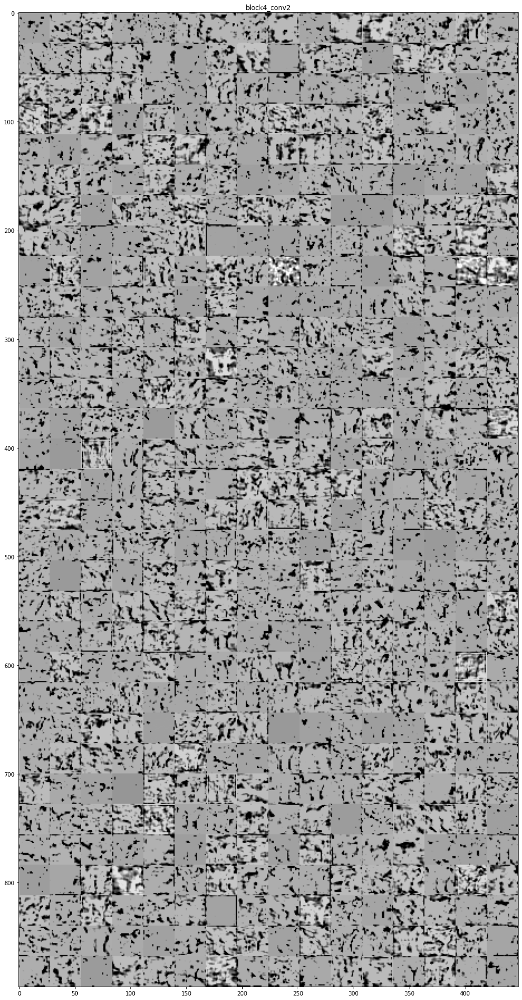

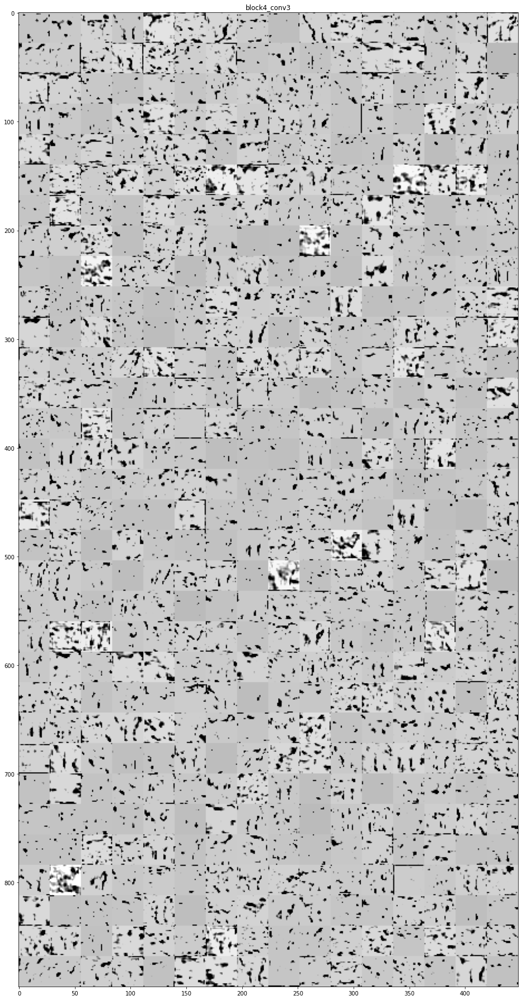

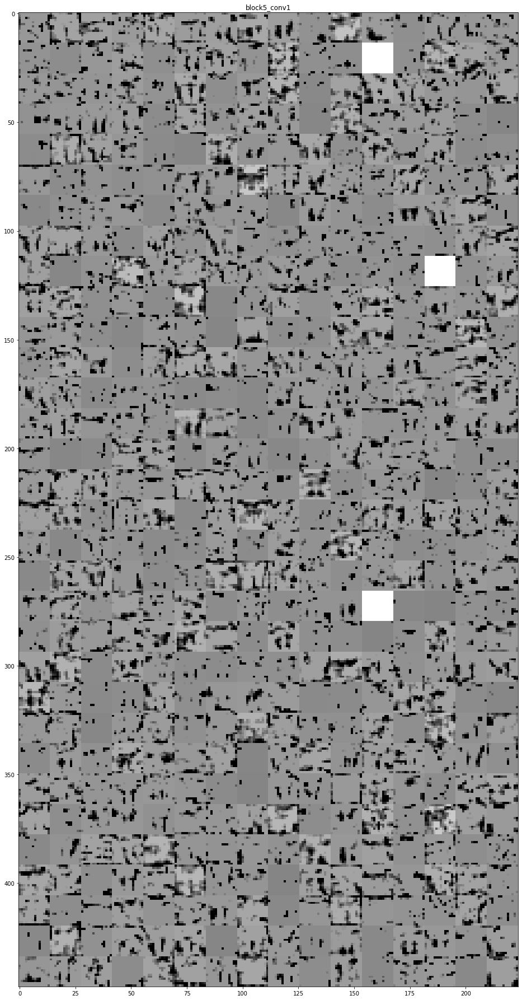

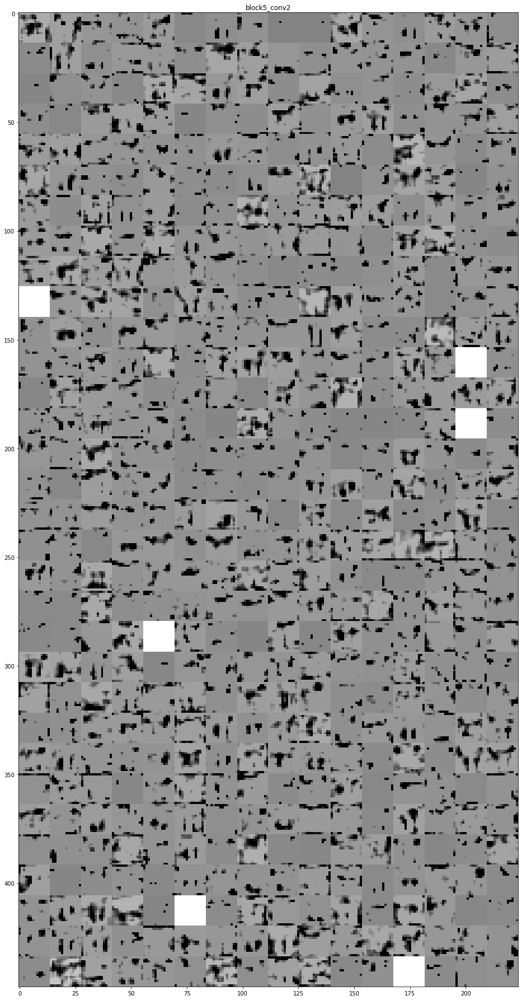

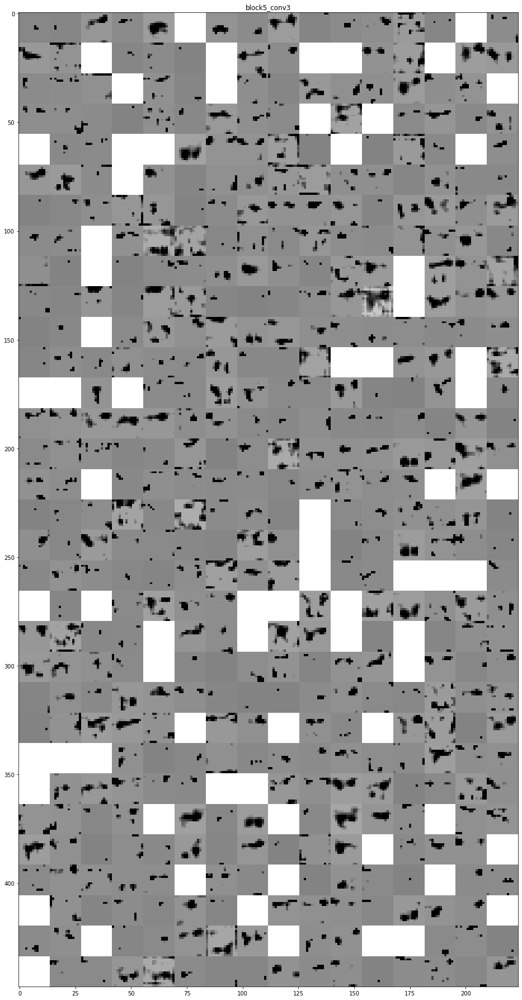

In [16]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model_vgg.layers:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    
    if layer_name == 'flatten': 
        break
    if 'conv' not in layer_name:
        continue
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    pyplot.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    pyplot.title(layer_name)
    pyplot.grid(False)
    pyplot.imshow(display_grid, aspect='auto', cmap='binary')
    
pyplot.show()


In [17]:
model_vgg.save('model_vgg.h5', save_format='h5')

In [33]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from tf_keras_vis.saliency import Saliency
from tensorflow.keras import backend as K
from tf_keras_vis.saliency import Saliency
from tf_keras_vis.utils import normalize


In [61]:
def pred_img(_img):
    img               = img_to_array(_img)
    img               = preprocess_input(img)
    y_pred            = model.predict(img[np.newaxis,...])
    class_idxs_sorted = np.argsort(y_pred.flatten())[::-1]
    topNclass         = 5
    for i, idx in enumerate(class_idxs_sorted[:topNclass]):
        print("Top {} predicted class:     Pr(Class={:18} [index={}])={:5.3f}".format(
              i + 1,classlabel[idx],idx,y_pred[0,idx]))


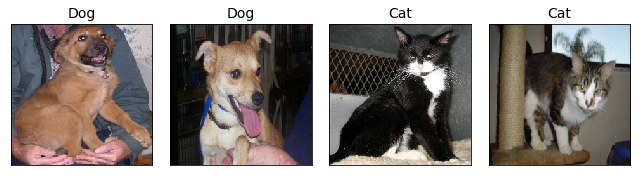

In [46]:
# from tensorflow.keras.preprocessing.image import load_img, img_to_array
# _img = load_img("cats_and_dogs_filtered/validation/dogs/dog.2470.jpg",target_size=(224,224))
# plt.imshow(_img)
# plt.show()


# Image titles
image_titles = ['Dog', 'Dog', 'Cat', 'Cat']

# Load images
img1 = load_img('cats_and_dogs_filtered/validation/dogs/dog.2470.jpg', target_size=(224, 224))
img2 = load_img('cats_and_dogs_filtered/validation/dogs/dog.2471.jpg', target_size=(224, 224))
img3 = load_img('cats_and_dogs_filtered/validation/cats/cat.2471.jpg', target_size=(224, 224))
img4 = load_img('cats_and_dogs_filtered/validation/cats/cat.2473.jpg', target_size=(224, 224))
images = np.asarray([np.array(img1), np.array(img2), np.array(img3), np.array(img4)])

# Preparing input data
X = preprocess_input(images)

# Rendering
subplot_args = { 'nrows': 1, 'ncols': 4, 'figsize': (9, 3),
                 'subplot_kw': {'xticks': [], 'yticks': []} }
f, ax = plt.subplots(**subplot_args)
for i, title in enumerate(image_titles):
    ax[i].set_title(title, fontsize=14)
    ax[i].imshow(images[i])
plt.tight_layout()
plt.show()


In [63]:
pred_img(img1)
pred_img(img2)
pred_img(img3)
pred_img(img4)

Top 1 predicted class:     Pr(Class=Pembroke           [index=263])=10.369
Top 2 predicted class:     Pr(Class=malinois           [index=225])=8.475
Top 3 predicted class:     Pr(Class=kelpie             [index=227])=8.375
Top 4 predicted class:     Pr(Class=Chihuahua          [index=151])=8.345
Top 5 predicted class:     Pr(Class=Cardigan           [index=264])=8.190
Top 1 predicted class:     Pr(Class=Chihuahua          [index=151])=10.164
Top 2 predicted class:     Pr(Class=dingo              [index=273])=9.117
Top 3 predicted class:     Pr(Class=kelpie             [index=227])=8.414
Top 4 predicted class:     Pr(Class=Pembroke           [index=263])=8.089
Top 5 predicted class:     Pr(Class=Border_terrier     [index=182])=7.830
Top 1 predicted class:     Pr(Class=Egyptian_cat       [index=285])=10.185
Top 2 predicted class:     Pr(Class=tabby              [index=281])=9.292
Top 3 predicted class:     Pr(Class=window_screen      [index=904])=8.245
Top 4 predicted class:     Pr(Class

In [47]:
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
model = VGG16(weights='imagenet')
model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [64]:
# The `output` variable refer to the output of the model,
# so, in this case, `output` shape is `(3, 1000)` i.e., (samples, classes).
def loss(output):
    return (output[0][263], output[1][151], output[2][285], output[3][281])
def model_modifier(m):
    m.layers[-1].activation = tf.keras.activations.linear
    return m


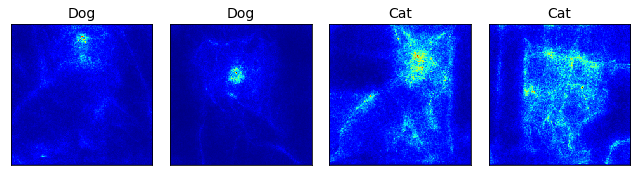

In [65]:
# Create Saliency object.
saliency = Saliency(model,
                    model_modifier=model_modifier,
                    clone=False)

# Generate saliency map with smoothing that reduce noise by adding noise
saliency_map = saliency(loss,
                        X,
                        smooth_samples=20, # The number of calculating gradients iterations.
                        smooth_noise=0.20) # noise spread level.
saliency_map = normalize(saliency_map)

f, ax = plt.subplots(**subplot_args)
for i, title in enumerate(image_titles):
    ax[i].set_title(title, fontsize=14)
    ax[i].imshow(saliency_map[i], cmap='jet')
plt.tight_layout()
plt.savefig('smoothgrad.png')
plt.show()


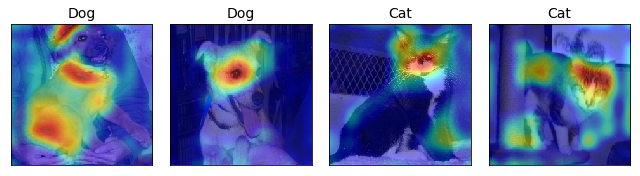

In [66]:
from matplotlib import cm
from tf_keras_vis.gradcam import Gradcam

# Create Gradcam object
gradcam = Gradcam(model,
                  model_modifier=model_modifier,
                  clone=False)

# Generate heatmap with GradCAM
cam = gradcam(loss,
              X,
              penultimate_layer=-1, # model.layers number
             )
cam = normalize(cam)

f, ax = plt.subplots(**subplot_args)
for i, title in enumerate(image_titles):
    heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)
    ax[i].set_title(title, fontsize=14)
    ax[i].imshow(images[i])
    ax[i].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
plt.tight_layout()
plt.show()
